# This script is used to prepare OP2 Long-horizon data handling

In [2]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import numba
from numba import cuda
import pandas as pd
import plotly
import plotly.graph_objects as go
import time
from matplotlib.cm import get_cmap
from scipy.spatial.distance import cdist
from WGS import WGS
import os
from datetime import datetime
import concurrent.futures
from shapely.geometry import Polygon, Point
from tqdm import tqdm
from joblib import Parallel, delayed
from matplotlib.gridspec import GridSpec
import pickle
from skgstat import Variogram
from scipy.interpolate import interp2d

def vectorize(v):
    return np.array(v).reshape(-1, 1)

# s1: load operation area
plg_op = pd.read_csv("OPA_GOOGLE_reduced.csv").to_numpy()
plg_op_shapely = Polygon(plg_op)
def is_point_legal(lat, lon):
    point = Point(lat, lon)
    return plg_op_shapely.contains(point)


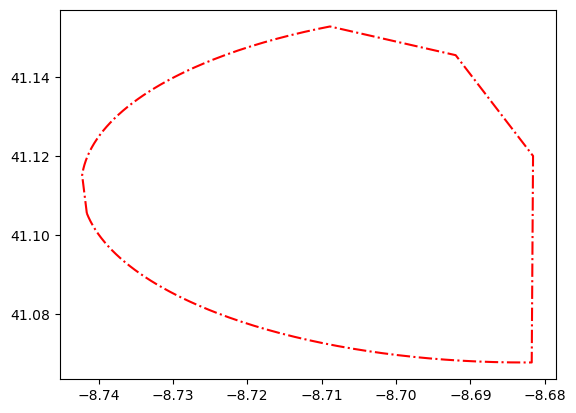

In [3]:
plt.plot(plg_op[:, 1], plg_op[:, 0], 'r-.')


## Section I: Data interpolation for OP2 Long-horizon (Prep, no need to run in Mission day)

In [3]:
# s2: load file
datapath = os.getcwd() + "/raw/March/"
files = os.listdir(datapath)
files.sort()
file = files[0]
df = h5py.File(datapath+file, 'r')

# s3: get lat,lon
t1 = time.time()
data = df.get('data')
lon = np.array(data.get("X")).squeeze()[0, :, :].flatten()
lat = np.array(data.get("Y")).squeeze()[0, :, :].flatten()
t2 = time.time()
print("Loading time takes: ", t2 - t1)

# s4: get indices of legal locations
t1 = time.time()
res = Parallel(n_jobs=4)(delayed(is_point_legal)(la, lo) for la, lo in zip(lat, lon))
ind_legal = np.where(res)[0]
t2 = time.time()
print("Finished, time consumed: ", t2 - t1)

indpath = "indices/"
files_ind = os.listdir(indpath)
dataset = {"lat": lat[ind_legal], "lon": lon[ind_legal], "North": {}, "East": {}, "South": {}, "West": {}}

def get_prior(filename): 
#     print("Load data")
    df_data = h5py.File(datapath + filename, 'r')
    data = df_data.get('data')
    sal_data = np.array(data["Val"])

#     print("Load ebb")
    iid = files_ind.index("F_"+filename[-14:-8]+".csv")
    df_ind = pd.read_csv(indpath + files_ind[iid])
    ind_ebb = np.where(df_ind["tide"] == "Ebb")[0]
    
#     print("appen dataset")
    for id_ebb in ind_ebb: 
#         print(id_ebb)
        wd = df_ind["wind_direction"][id_ebb]
        wl = df_ind["wind_level"][id_ebb]
#         print(wd, wl)
        sal_temp = sal_data[0, :, :, id_ebb].flatten()[ind_legal]
        dataset[wd].setdefault(wl, []).append(sal_temp)


for file in tqdm(files): 
    get_prior(file)

# Parallel(n_jobs=7)(delayed(get_prior)(file) for file in files) # not use parallel, since it is not working

# dataset
# print(df_ind)
# print(df_ind["wind_direction"])
# print(df_ind["wind_level"])

# ind_ebb = np.where(df_ind["tide"] == "Ebb")[0]

# for index in ind_ebb: 
#     wd = df_ind["wind_direction"][index]
#     wl = df_ind["wind_level"][index]
#     sal_temp = sal_data[0, :, :, index].flatten()[ind_legal]
#     break
# iid = files_ind.index("F_"+file[-14:-8]+".csv")
# df_ind = pd.read_csv(files_ind[iid])

# np.where(df_ind["tide"] == "Ebb")[0]

# save to file
a = dataset
with open('nov_prior.pickle', 'wb') as handle:
    pickle.dump(a, handle, protocol=pickle.HIGHEST_PROTOCOL)

with open('nov_prior.pickle', 'rb') as handle:
    b = pickle.load(handle)

FileNotFoundError: [Errno 2] No such file or directory: 'raw/Nov/'

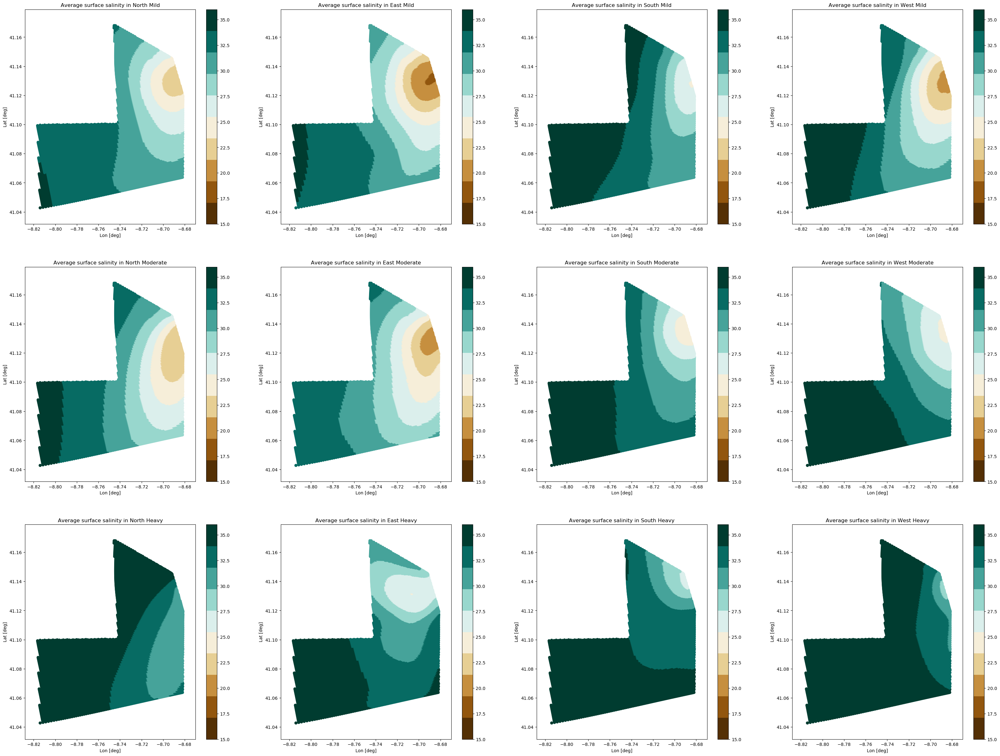

In [64]:
# sal_int = sal_data[0, :, :, 0].flatten()[ind_legal]
lon_int = lon[ind_legal]
lat_int = lat[ind_legal]

fig = plt.figure(figsize=(40, 30))
gs = GridSpec(nrows=3, ncols=4)

cnt_row = 0
for levels in ["Mild", "Moderate", "Heavy"]:
    cnt_col = 0
    for dirs in ["North", "East", "South", "West"]:
#         print(cnt_row, cnt_col)
        st = np.array(dataset[dirs][levels])
        
        ax = fig.add_subplot(gs[cnt_row, cnt_col])
        im = ax.scatter(lon_int, lat_int, c=np.mean(st, axis=0), cmap=get_cmap("BrBG", 10), vmin=15, vmax=36)
        plt.colorbar(im)
        ax.set_title("Average surface salinity in " + dirs + " " + levels)
        ax.set_xlabel("Lon [deg]")
        ax.set_ylabel("Lat [deg]")
        
        cnt_col += 1
    cnt_row += 1
plt.savefig("GOOGLE.png")

## Section II: MOHID data kriging, TODO: select time window for operation (Run on or before mission day)



## GRF Kriging set up

In [40]:
# s0: config the parameters and time window
mission_date = "2022-10-01_2022-10-02"
wind_dir = "North"
wind_level = "Moderate"
ts = 10
te = 16
sigma = .5
nugget = .04
range_lateral = 900
eta = 4.5 / range_lateral # coef in matern kernel


lato = 41.04068871469593 
lono = -8.813846858228182
wg = WGS()
wg.set_origin(lato, lono)

# s1: load prior data from delft3d
with open('oct_prior.pickle', 'rb') as handle:
    oct_prior = pickle.load(handle)

lat_d = oct_prior['lat']
lon_d = oct_prior['lon']
sal_d = np.mean(oct_prior[wind_dir][wind_level], axis=0)

# s2: load mohid data
mohid_path = "mohid/"
files = os.listdir(mohid_path)
files.remove("README.md")
files.sort()
ind_date = files.index(mission_date)
file = files[ind_date] + "/WaterProperties.hdf5" # load latest mohid data
print("Now it will load the MOHID data...")
t1 = time.time()
data = h5py.File(mohid_path + file, 'r')
grid = data.get('Grid')
lat = np.array(grid.get("Latitude"))[:-1, :-1].flatten()
lon = np.array(grid.get("Longitude"))[:-1, :-1].flatten()
depth = []
sal_mohid = []
for i in range(1, 26):
    string_z = "Vertical_{:05d}".format(i)
    string_sal = "salinity_{:05d}".format(i)
    depth.append(np.mean(np.array(grid.get("VerticalZ").get(string_z)), axis = 0))
    sal_mohid.append(np.mean(np.array(data.get("Results").get("salinity").get(string_sal)), axis = 0))
depth = np.array(depth)
sal_mohid = np.array(sal_mohid)
t2 = time.time()
print("Data is loaded correctly, time consumed: ", t2 - t1)
res = Parallel(n_jobs=14)(delayed(is_point_legal)(la, lo) for la, lo in zip(lat, lon))
ind_legal_mohid = np.where(res)[0]

# for i in tqdm(range(sal_mohid.shape[0])):
#     plt.figure()
#     plt.scatter(lon[ind_legal_mohid], lat[ind_legal_mohid], c=sal_mohid[i, :, :].flatten()[ind_legal_mohid], 
#                 cmap=get_cmap("BrBG", 10), vmin=10, vmax=36)
#     plt.colorbar()
#     plt.plot(plg_op[:, 1], plg_op[:, 0], 'k-.')
#     plt.title("Salinity field from MOHID at " + str(i) + " o'clock")
#     plt.xlabel("Lon [deg]")
#     plt.ylabel("Lat [deg]")
#     plt.savefig("fig/mohid/P_{:03d}.png".format(i))
#     plt.close("all")


Now it will load the MOHID data...
Data is loaded correctly, time consumed:  0.07144522666931152


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:05<00:00,  4.59it/s]


In [41]:
df_mohid = np.stack((lat[ind_legal_mohid], lon[ind_legal_mohid], np.mean(sal_mohid[ts:te, :, :], axis=0).flatten()[ind_legal_mohid]), axis=1)

# s3: construct distance matrix
xd, yd = wg.latlon2xy(lat_d, lon_d)
grid = np.stack((xd, yd), axis=1)
dm_gg = cdist(grid, grid)

xm, ym = wg.latlon2xy(df_mohid[:, 0], df_mohid[:, 1])
sample = np.stack((xm, ym), axis=1)
dm_ss = cdist(sample, sample)

dm_gs = cdist(grid, sample)

# s4: construct matern kernel
def Cov(dm):
    return sigma**2 * (1 + eta * dm) * np.exp(-eta * dm) 

Sig_gg = Cov(dm_gg)
Sig_ss = Cov(dm_ss)
Sig_gs = Cov(dm_gs)


# s5: krige the field
# s51: interpolate values to sampled areas
ind_selected = np.where((xd > 5400) * 
                        (yd > 7000))[0]
x_sel = xd[ind_selected]
y_sel = yd[ind_selected]
sal_sel = sal_d[ind_selected]
grid_1 = np.stack((x_sel, y_sel), axis=1)
grid_2 = np.stack((xm, ym), axis=1)
dm_g21 = cdist(grid_2, grid_1)
ind_close = np.argmin(dm_g21, axis=1)
xb = sal_sel[ind_close]

# plt.scatter(ym, xm, c=df_mohid[:, 2], cmap=get_cmap("BrBG", 10), vmin=10, vmax=36)
# plt.plot(yplg, xplg, 'r-.')
# plt.axvline(7000)
# plt.axhline(5400)
# plt.colorbar()
# plt.show()

# plt.scatter(ym, xm, c=xb, cmap=get_cmap("BrBG", 10), vmin=10, vmax=36)
# plt.plot(yplg, xplg, 'r-.')
# plt.axvline(7000)
# plt.axhline(5400)
# plt.colorbar()
# plt.show()

# s52: krige the field
mu_cond = sal_d.reshape(-1, 1) + Sig_gs @ np.linalg.solve(Sig_ss, (xb.reshape(-1, 1) - df_mohid[:, 2].reshape(-1, 1)))
Sigma_cond = Sig_gg - Sig_gs @ np.linalg.solve(Sig_ss, Sig_gs.T)



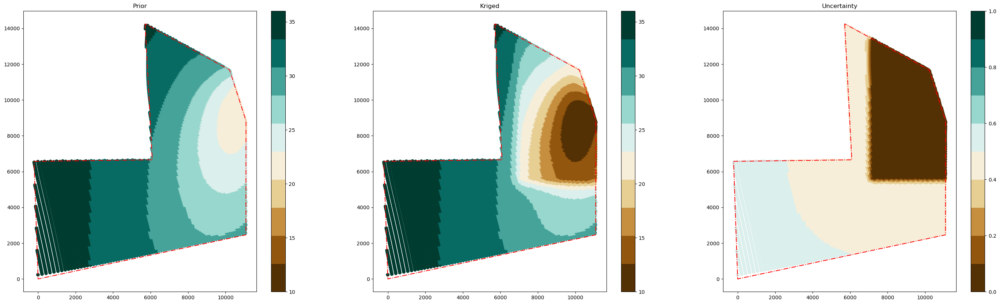

In [42]:

fig = plt.figure(figsize=(35, 10))
gs = GridSpec(nrows=1, ncols=3)
ax = fig.add_subplot(gs[0])
im = ax.scatter(yd, xd, c=sal_d, cmap=get_cmap("BrBG", 10), vmin=10, vmax=36)
ax.plot(yplg, xplg, 'r-.')
plt.colorbar(im)
plt.title("Prior")

ax = fig.add_subplot(gs[1])
im = ax.scatter(yd, xd, c=mu_cond.flatten(), cmap=get_cmap("BrBG", 10), vmin=10, vmax=36)
ax.plot(yplg, xplg, 'r-.')
plt.colorbar(im)
plt.title("Kriged")

ax = fig.add_subplot(gs[2])
im = ax.scatter(yd, xd, c=np.sqrt(np.diag(Sigma_cond)), cmap=get_cmap("BrBG", 10), vmin=0, vmax=1)
ax.plot(yplg, xplg, 'r-.')
plt.colorbar(im)
plt.title("Uncertainty")

plt.savefig("Check.png")
plt.show()



## Variogram analysis on Delft3D


[2.99999989e+03 6.47980109e+00 4.68589604e-12]


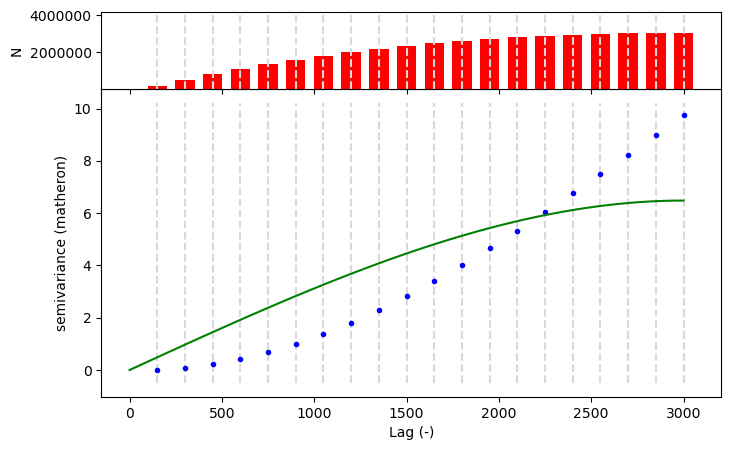

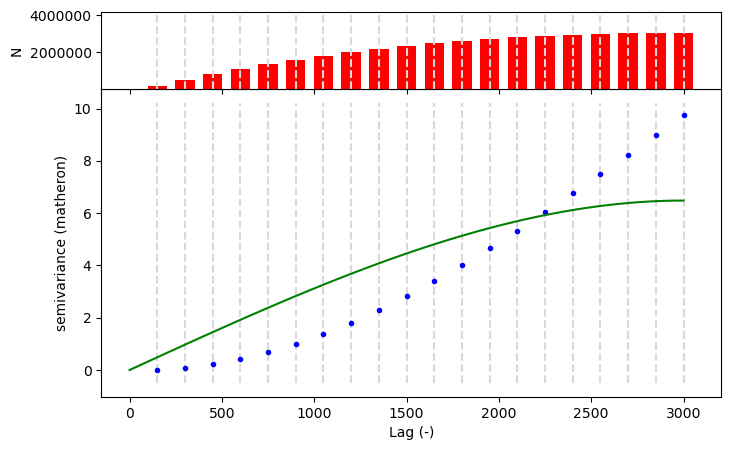

In [52]:
with open('oct_prior.pickle', 'rb') as handle:
    oct_prior = pickle.load(handle)

lat_d = oct_prior['lat']
lon_d = oct_prior['lon']

wind_dir = "North"
wind_level = "Moderate"
sal_d = np.mean(oct_prior[wind_dir][wind_level], axis=0)

lato = 41.04068871469593 
lono = -8.813846858228182
wg = WGS()
wg.set_origin(lato, lono)

xd, yd = wg.latlon2xy(lat_d, lon_d)
residual = sal_d - np.mean(sal_d)
V_v = Variogram(coordinates = np.stack((xd, yd), axis=1), values = residual, n_lags = 20, maxlag = 3000, use_nugget=True)
print(V_v.cof)
V_v.plot()

# t1 = time.time()
# for i in range(salinity.shape[0]):
#     S_sample = salinity[i, :, :, 0].reshape(-1, 1) # sample each frame
#     residual = S_sample - S_f
#     range_coef.append(V_v.cof[0])
#     sill_coef.append(V_v.cof[1])
#     nugget_coef.append(V_v.cof[2])

## Section II: Path planner RRT setup


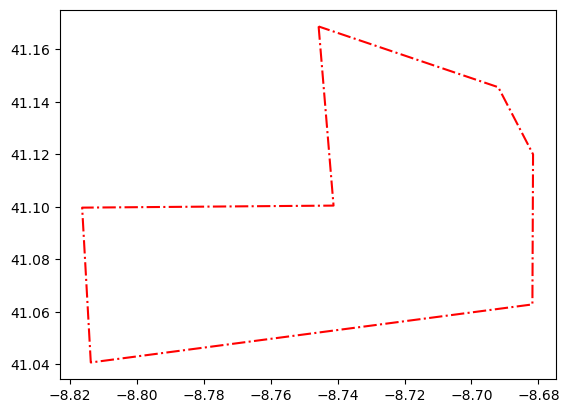

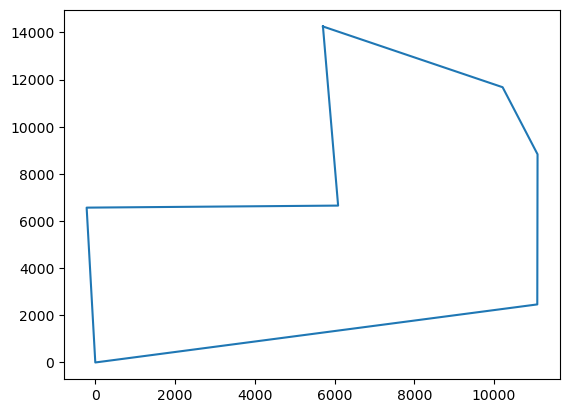

In [8]:
plt.plot(plg_op[:, 1], plg_op[:, 0], 'r-.')
plt.show()
wg = WGS()
lat_o = 41.04068871469593
lon_o = -8.813846858228182
wg.set_origin(lat_o, lon_o)
x, y = wg.latlon2xy(plg_op[:, 0], plg_op[:, 1])
plt.plot(y, x)


array([[41.168745  , -8.74571   ],
       [41.10048   , -8.741247  ],
       [41.099704  , -8.816434  ],
       [41.04068871, -8.81384686],
       [41.06281805, -8.68177461],
       [41.12003106, -8.68158045],
       [41.14559747, -8.69198278],
       [41.168745  , -8.74571   ]])

# RRT* Planner preparation

## Step I: Random location generation

In [3]:
lat_origin =  41.04068871469593
lon_origin = -8.813846858228182
wg = WGS()
wg.set_origin(lat_origin, lon_origin)
x, y = wg.latlon2xy(plg_op[:, 0], plg_op[:, 1])

In [4]:
N = 10000000

# def get_random_location(N):
#     for i in range(N):
xmin, ymin = map(np.amin, [x, y])
xmax, ymax = map(np.amax, [x, y])

plg_xy = np.stack((x, y), axis=1)
plg_shapely = Polygon(plg_xy)

def get_random_locations(n):
    locations = []
    for i in tqdm(range(n)):  
        xr = np.random.uniform(xmin, xmax)
        yr = np.random.uniform(ymin, ymax)
        point = Point(xr, yr)
        if plg_shapely.contains(point):
            locations.append([xr, yr])
    locs = np.array(locations)
    print("Acceptance rate: ", len(locs) / N)
    print("Total {:d} random locations are generated!".format(len(locs)))
    print("Can be used for {:d} iterations in RRT* planning".format(int(len(locs)/2000)))
    return locs

TT = 800000 * np.ones(12).astype(int)
res = Parallel(n_jobs=12)(delayed(get_random_locations)(tt) for tt in TT)

rest = np.empty([0, 2])
for i in range(len(res)):
    rest = np.append(rest, res[0], axis=0)

100%|██████████| 800000/800000 [00:30<00:00, 26586.98it/s]

In [19]:
plt.figure(figsize=(100, 100))
plt.plot(plg_xy[:, 1], plg_xy[:, 0], 'r-.')
# plt.plot(locs[:, 1], locs[:, 0], 'k.', alpha=.1)
plt.plot(rest[:, 1], rest[:, 0], 'k.', alpha=.1)

In [12]:
indices = np.random.uniform(0, 1., len(rest))

In [13]:
rest.shape

(5398356, 2)

In [14]:
indices.shape

(5398356,)

In [15]:
np.save("RRT_Random_Locations.npy", rest)
np.save("Goal_indices.npy", indices)

Acceptance rate:  0.0450331
Total 450331 random locations are generated!
Can be used for 225 iterations in RRT* planning
Acceptance rate:  0.0450746
Total 450746 random locations are generated!
Can be used for 225 iterations in RRT* planning
Acceptance rate:  0.0450444
Total 450444 random locations are generated!
Can be used for 225 iterations in RRT* planning
Acceptance rate:  0.0450553
Total 450553 random locations are generated!
Can be used for 225 iterations in RRT* planning


Acceptance rate:  0.0449863
Total 449863 random locations are generated!
Can be used for 224 iterations in RRT* planning
Acceptance rate:  0.0450522
Total 450522 random locations are generated!
Can be used for 225 iterations in RRT* planning
Acceptance rate:  0.0449774
Total 449774 random locations are generated!
Can be used for 224 iterations in RRT* planning
Acceptance rate:  0.0449696
Total 449696 random locations are generated!
Can be used for 224 iterations in RRT* planning
Acceptance rate:  0.0450433
Total 450433 random locations are generated!
Can be used for 225 iterations in RRT* planning


Acceptance rate:  0.0450662
Total 450662 random locations are generated!
Can be used for 225 iterations in RRT* planning
Acceptance rate:  0.045033
Total 450330 random locations are generated!
Can be used for 225 iterations in RRT* planning


Acceptance rate:  0.0449922
Total 449922 random locations are generated!
Can be used for 224 iterations in RRT* planning
